In [119]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import re
import os
import time
import datetime
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler
import math
import warnings
warnings.filterwarnings(action = 'ignore')
from scipy import stats
from statsmodels.tools.tools import add_constant
from statsmodels.stats.outliers_influence import variance_inflation_factor  
from statsmodels.tsa.stattools import adfuller

from analysis import *
from plot import *

데이터 소개

1. 전기 분해를 통해 특정 소재를 생산하는 공정의 데이터입니다. train과 test 파일 각각은 동일한 컬럼을 가지고 있습니다.

2. 30개의 조업 변수(ex. 온도,압력,속도 등)와 5개의 관리 변수가 있습니다.

3. 관리 변수

A: 제품 생산량 (클수록 좋음)

B: 최종 제품 형태 전환율 (클수록 좋음)

C: 전류효율 (클수록 좋음)

D: 폐기물1 농도 (낮을수록 좋음)

E: 폐기물2 농도 (낮을수록 좋음)

4. 관리 변수 5개를 토대로 품질 및 생산성이 좋아지고 원가도 낮아집니다.

# 0. 결과 요약


< INSIGHTS >
- 어떤 문제가 발생하고 있나?


- 그 문제는 왜 발생한다고 생각하나?

- 그 문제를 해결하기 위해서는 어떻게 해야하나?

- 그 해결책은 얼마나 신뢰성이 있는가?

- 그 해결책을 적용하면 어떤 이점이 발생하나?

- 결과 고찰



# 1. 데이터 로드 및 기본 정보 확인

## 1.1. 데이터 로드

In [2]:
train = pd.read_csv("../data/anomaly/train.csv")
test = pd.read_csv("../data/anomaly/test.csv")

## 1.2. 기본 정보 확인

### 1.2.1. 상위 5개 ROW 확인

In [3]:
train.head()

,Getting_Time,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X26,X27,X28,X29,X30,A,B,C,D,E
0,2022-11-25 06:15:00,3.999053,2.904105,0.512421,17.256421,11.969895,9.808474,17.270632,11.782316,9.716105,...,0.085053,0.080737,0.020842,0.044421,0.066474,533.740825,56.166584,30.795462,0.063058,0.032226
1,2022-11-25 06:16:00,3.997158,2.904789,0.496368,17.296263,11.962579,9.812632,17.274737,11.792474,9.713211,...,0.088000,0.080316,0.019947,0.048158,0.066316,533.704004,56.165217,30.695193,0.063065,0.032231
2,2022-11-25 06:17:00,3.996947,2.906474,0.489158,17.300737,11.971579,9.801684,17.277105,11.788526,9.715632,...,0.085421,0.081684,0.019263,0.046579,0.067526,533.667183,56.163850,30.687938,0.063071,0.032236
3,2022-11-25 06:18:00,3.995895,2.904105,0.483526,17.274789,11.960579,9.818579,17.250158,11.795211,9.721105,...,0.083263,0.082316,0.018000,0.043684,0.067316,533.630362,56.162483,30.703927,0.063078,0.032241
4,2022-11-25 06:19:00,3.994316,2.901000,0.504579,17.267421,11.971684,9.815421,17.277000,11.790158,9.730263,...,0.085474,0.081368,0.018316,0.046368,0.066263,533.593541,56.161116,30.756081,0.063085,0.032246


In [4]:
test.head()

,Getting_Time,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X26,X27,X28,X29,X30,A,B,C,D,E
0,2022-12-16 05:58:00,3.999263,3.846000,0.549842,16.994632,11.817421,9.902316,16.914316,11.960895,9.828211,...,0.072368,0.119000,0.018053,0.034737,0.073947,709.332018,70.319533,40.767668,0.102394,0.033533
1,2022-12-16 05:59:00,4.000316,3.844789,0.552421,17.084105,11.825632,9.922000,16.953000,11.897316,9.840842,...,0.071947,0.121947,0.017947,0.032895,0.077421,709.352140,70.311578,40.684181,0.102380,0.033533
2,2022-12-16 06:00:00,3.999368,3.846368,0.551789,17.103421,11.825632,9.919211,16.955789,11.898684,9.843526,...,0.075053,0.119684,0.017368,0.034632,0.076368,709.372261,70.303627,40.742948,0.102367,0.033533
3,2022-12-16 06:01:00,4.000105,3.850789,0.550474,17.127474,11.827000,9.932000,16.913421,11.911000,9.830842,...,0.074263,0.121053,0.016947,0.036211,0.076158,709.392383,70.295677,40.757165,0.102353,0.033533
4,2022-12-16 06:02:00,4.000526,3.855737,0.549421,17.118947,11.821526,9.915579,16.939737,11.904632,9.851895,...,0.074526,0.119263,0.017316,0.034526,0.074368,709.412505,70.287729,40.669284,0.102340,0.033533


### 1.2.2. 데이터셋 기본 정보 확인

- `Getting_Time`: 문자열 $→$ datetime 타입으로 변경 필요.




In [5]:
print(train.shape)
train.info() # 43865 ROWS

(43865, 36)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43865 entries, 0 to 43864
Data columns (total 36 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Getting_Time  43865 non-null  object 
 1   X1            43865 non-null  float64
 2   X2            43865 non-null  float64
 3   X3            43865 non-null  float64
 4   X4            43865 non-null  float64
 5   X5            43865 non-null  float64
 6   X6            43865 non-null  float64
 7   X7            43865 non-null  float64
 8   X8            43865 non-null  float64
 9   X9            43865 non-null  float64
 10  X10           43865 non-null  float64
 11  X11           43865 non-null  float64
 12  X12           43865 non-null  float64
 13  X13           43865 non-null  float64
 14  X14           43865 non-null  float64
 15  X15           43865 non-null  float64
 16  X16           43865 non-null  float64
 17  X17           43865 non-null  float64
 18  X18           

In [6]:
print(test.shape)
test.info() # 18798 ROWS

(18798, 36)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18798 entries, 0 to 18797
Data columns (total 36 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Getting_Time  18798 non-null  object 
 1   X1            18798 non-null  float64
 2   X2            18798 non-null  float64
 3   X3            18798 non-null  float64
 4   X4            18798 non-null  float64
 5   X5            18798 non-null  float64
 6   X6            18798 non-null  float64
 7   X7            18798 non-null  float64
 8   X8            18798 non-null  float64
 9   X9            18798 non-null  float64
 10  X10           18798 non-null  float64
 11  X11           18798 non-null  float64
 12  X12           18798 non-null  float64
 13  X13           18798 non-null  float64
 14  X14           18798 non-null  float64
 15  X15           18798 non-null  float64
 16  X16           18798 non-null  float64
 17  X17           18798 non-null  float64
 18  X18           

In [7]:
train["Getting_Time"] = pd.to_datetime(train["Getting_Time"])
test["Getting_Time"] = pd.to_datetime(test["Getting_Time"])

# train.index = train["Getting_Time"]
# test.index = test["Getting_Time"]

### 1.2.3. 각 컬럼 별 분포 확인

In [8]:
train.describe()

,Getting_Time,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X26,X27,X28,X29,X30,A,B,C,D,E
count,43865,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,...,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000,43865.000000
mean,2022-12-23 11:46:07.854097664,3.999065,3.532890,0.648919,16.547569,11.901477,9.962498,16.878494,11.880180,9.920205,...,0.060887,0.075775,0.011387,0.029563,0.054767,732.676639,73.137974,44.826692,0.069215,0.037083
min,2022-11-25 06:15:00,3.396421,2.825947,0.483158,1.863579,11.760158,9.610263,16.197056,11.358789,9.333737,...,0.000000,0.000000,0.000000,0.003368,0.001947,309.206376,56.059620,20.839917,0.048630,0.024308
25%,2022-12-02 21:01:00,3.997263,3.102368,0.549263,15.576053,11.870000,9.921632,16.783579,11.620421,9.882526,...,0.046444,0.011737,0.005316,0.023526,0.010737,710.951027,70.344253,40.752947,0.056610,0.030451
50%,2022-12-10 11:47:00,3.998421,3.551789,0.551632,16.938842,11.897842,9.956263,16.913947,11.970947,9.913632,...,0.065579,0.102263,0.013263,0.030842,0.071789,725.829171,73.418290,41.608692,0.066805,0.033535
75%,2023-01-28 11:49:00,3.999474,3.828842,0.749684,17.016211,11.932632,10.000105,16.980474,12.036263,9.956263,...,0.073947,0.110632,0.015789,0.035947,0.074737,763.627160,75.449318,51.770959,0.081045,0.049563
max,2023-02-06 22:07:00,4.542611,4.094789,0.959105,17.372000,12.093000,10.397000,17.306263,12.426895,10.419421,...,0.093556,0.143579,0.033842,0.064944,0.084895,842.617938,82.916915,58.090847,0.105644,0.055485
std,NaN,0.013643,0.346338,0.157189,0.721432,0.049041,0.054030,0.159528,0.220845,0.064377,...,0.016262,0.046731,0.005889,0.008500,0.029516,54.249236,3.646940,6.440145,0.014608,0.009550


In [9]:
test.describe()

,Getting_Time,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X26,X27,X28,X29,X30,A,B,C,D,E
count,18798,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,...,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000,18798.000000
mean,2023-01-06 21:33:07.634854656,3.999731,3.652261,0.650084,16.444624,11.833745,9.917704,16.751573,11.736266,10.009239,...,0.060463,0.087494,0.011975,0.025682,0.048723,709.541192,71.363528,43.836735,0.088622,0.040779
min,2022-12-16 05:58:00,3.970421,3.077368,0.480632,14.945158,11.713211,9.719526,16.111895,11.190211,9.748842,...,0.031684,0.000000,0.000000,0.000000,0.001737,455.267826,66.385145,26.292458,0.047400,0.032040
25%,2022-12-19 12:18:15,3.997579,3.102368,0.498947,15.320434,11.785211,9.851842,16.441526,11.413526,9.800263,...,0.052267,0.015474,0.004526,0.013158,0.011158,694.239057,68.774958,39.956387,0.058474,0.034263
50%,2022-12-23 09:46:30,3.998737,3.850474,0.501053,16.993737,11.807816,9.894158,16.891316,11.868737,9.904947,...,0.061211,0.119158,0.013842,0.030789,0.059263,709.613763,70.252579,40.796366,0.099819,0.037186
75%,2023-02-08 22:59:45,3.999895,3.948684,0.949474,17.069579,11.835158,9.989750,16.954474,11.951474,10.312368,...,0.069947,0.126842,0.017421,0.035263,0.074316,752.314704,73.743521,53.295402,0.105912,0.051541
max,2023-02-18 23:59:00,4.062053,3.960632,1.058105,17.334053,12.108474,10.109368,17.296684,12.159579,10.922105,...,0.082105,0.137579,0.023895,0.049158,0.081947,840.769870,80.415813,57.053799,0.117283,0.055107
std,NaN,0.007819,0.374215,0.223490,0.873059,0.074963,0.078567,0.302045,0.273602,0.270394,...,0.011008,0.053647,0.006516,0.012975,0.028072,68.028360,3.299126,7.332593,0.022347,0.008067


### 1.2.4. 결측치 확인

- train, test 모두 전 컬럼에 결측치 없음.

In [44]:
def check_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    데이터프레임의 각 컬럼에 대한 기본 정보를 출력하는 함수
    
    Parameters:
    -----------
    df : pandas.DataFrame
        분석할 데이터프레임
    
    Returns:
    --------
    None
        각 컬럼별 관찰값 개수, 유니크한 값 개수, 결측치 비율을 출력
    """
    print(f"<데이터 전체 관찰값 개수 = {len(df)}>", "\n")
    for col in df.columns:
        print(f"{col}: 관찰값 개수 = {len(df[col])}, 유니크한 관찰값 개수 = {df[col].nunique(dropna = False)}, 결측치 비율 = {100 * round(df[col].isnull().sum() / len(df[col]), 4)}%")

In [47]:
pd.set_option('display.max_rows', 100)
check_columns(train)

<데이터 전체 관찰값 개수 = 43865> 

Getting_Time: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 43865, 결측치 비율 = 0.0
X1: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 1685, 결측치 비율 = 0.0
X2: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 7409, 결측치 비율 = 0.0
X3: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 1848, 결측치 비율 = 0.0
X4: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 11861, 결측치 비율 = 0.0
X5: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 4258, 결측치 비율 = 0.0
X6: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 4837, 결측치 비율 = 0.0
X7: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 10319, 결측치 비율 = 0.0
X8: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 9566, 결측치 비율 = 0.0
X9: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 4910, 결측치 비율 = 0.0
X10: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 6838, 결측치 비율 = 0.0
X11: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 8488, 결측치 비율 = 0.0
X12: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 7894, 결측치 비율 = 0.0
X13: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 2995, 결측치 비율 = 0.0
X14: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 2133, 결측치 비율 = 0.0
X15: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 4158, 결측치 비율 = 0.0
X16: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 1478, 결측치 비율 = 0.0
X17: 관찰값 개수 = 43865, 유니크한 관찰값 개수 = 2169, 결측치 비율 = 0.0

In [48]:
check_columns(test)

<데이터 전체 관찰값 개수 = 18798> 

Getting_Time: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 18797, 결측치 비율 = 0.0
X1: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 802, 결측치 비율 = 0.0
X2: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 1806, 결측치 비율 = 0.0
X3: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 1112, 결측치 비율 = 0.0
X4: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 7376, 결측치 비율 = 0.0
X5: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 2827, 결측치 비율 = 0.0
X6: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 4128, 결측치 비율 = 0.0
X7: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 6726, 결측치 비율 = 0.0
X8: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 6237, 결측치 비율 = 0.0
X9: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 3848, 결측치 비율 = 0.0
X10: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 4593, 결측치 비율 = 0.0
X11: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 5131, 결측치 비율 = 0.0
X12: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 5120, 결측치 비율 = 0.0
X13: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 1629, 결측치 비율 = 0.0
X14: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 1939, 결측치 비율 = 0.0
X15: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 1527, 결측치 비율 = 0.0
X16: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 683, 결측치 비율 = 0.0
X17: 관찰값 개수 = 18798, 유니크한 관찰값 개수 = 1840, 결측치 비율 = 0.0
X18

### 1.2.5. 날짜 범위 확인

<img src = "time_range.png">

- TRAIN DATA
  - 전체 일수 및 범위 = 총 73일 (2022-11-25 ~ 2023-02-06)

  - 데이터가 있는 일수 및 범위 = 총 35일 (2022-11-25 ~ 2023-02-06)
    - train_before = 총 22일 (2022-11-25 06:15:00 ~ 2022-12-16 05:56:00)
    - train_after = 총 13일 (2023-01-25 10:36:00 ~ 2023-02-06 22:07:00)

  - **생략된 일수 및 범위 = 총 38일 (2022-12-17 ~ 2023-01-24)**

- TEST DATA
  - 전체 일수 및 범위 = 총 64일 (2022-12-16 ~ 2023-02-18)

  - 데이터가 있는 일수 및 범위 = 총 24일 (2022-12-16 ~ 2023-02-18)
    - test_before = 총 11일 (2022-12-16 05:58:00 ~ 2022-12-26 23:59:00)
    - test_after = 총 13일 (2023-02-06 22:18:00 ~ 2023-02-18 23:59:00)

  - **생략된 일수 및 범위 = 총 41일 (2022-12-27 ~ 2023-02-05)**

- TRAIN과 TEST 모두에서 **2022-12-27 ~ 2023-01-24 데이터가 없음.**
  - **해당 날짜 범위 기간에 공정 개선 또는 리뉴얼 작업이 이루어진 것으로 추정.**
  - 해당 가설을 중심으로, 추후 분석.


In [19]:
analyze_operation_periods(train, "TRAIN")

< TRAIN DATA >
전체 일수 및 범위 = 총 73일 (2022-11-25 ~ 2023-02-06)

가동 일수 및 범위 = 총 35일 (2022-11-25 ~ 2023-02-06)
- 범위 1 = 총 22일 (2022-11-25 ~ 2022-12-16)
- 범위 2 = 총 13일 (2023-01-25 ~ 2023-02-06)

생략된 일수 및 범위 = 총 39일 (2022-12-17 ~ 2023-01-24)


In [20]:
analyze_operation_periods(test, label="TEST")

< TEST DATA >
전체 일수 및 범위 = 총 64일 (2022-12-16 ~ 2023-02-18)

가동 일수 및 범위 = 총 24일 (2022-12-16 ~ 2023-02-18)
- 범위 1 = 총 11일 (2022-12-16 ~ 2022-12-26)
- 범위 2 = 총 13일 (2023-02-06 ~ 2023-02-18)

생략된 일수 및 범위 = 총 41일 (2022-12-27 ~ 2023-02-05)


In [23]:
# 트레인 데이터 날짜 및 시간 확인
print(train["Getting_Time"].min())
print(train["Getting_Time"].max())

2022-11-25 06:15:00
2023-02-06 22:07:00


In [24]:
# 테스트데이터 날짜 및 시간 확인
print( test["Getting_Time"].min())
print(test["Getting_Time"].max())

2022-12-16 05:58:00
2023-02-18 23:59:00


In [25]:
y_columns = ['A', 'B', 'C', 'D', 'E']

train_before = train[train['Getting_Time'].dt.date <= datetime.date(2022, 12, 16)]
train_after = train[train['Getting_Time'].dt.date > datetime.date(2022, 12, 16)]
test_before = test[test['Getting_Time'].dt.date <= datetime.date(2022, 12, 26)]
test_after = test[test['Getting_Time'].dt.date > datetime.date(2022, 12, 26)]

print(f"TRAIN (리뉴얼 이전) shape: {train_before.shape}")
print(f"TEST (리뉴얼 이전) shape: {test_before.shape}")
print(f"TRAIN (리뉴얼 이후) shape: {train_after.shape}")
print(f"TEST (리뉴얼 이후) shape: {test_after.shape}")

TRAIN (리뉴얼 이전) shape: (30178, 36)
TEST (리뉴얼 이전) shape: (12933, 36)
TRAIN (리뉴얼 이후) shape: (13687, 36)
TEST (리뉴얼 이후) shape: (5865, 36)


In [ ]:
train_before.set_index("Getting_Time", inplace=True, drop=True)
test_before.set_index("Getting_Time", inplace=True, drop=True)
train_after.set_index("Getting_Time", inplace=True, drop=True)
test_after.set_index("Getting_Time", inplace=True, drop=True)

before = pd.concat([train_before, test_before], axis = 0)
after = pd.concat([train_after, test_after], axis = 0)

In [41]:
train_before

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2022-11-25 06:15:00,3.999053,2.904105,0.512421,17.256421,11.969895,9.808474,17.270632,11.782316,9.716105,17.261368,...,0.085053,0.080737,0.020842,0.044421,0.066474,533.740825,56.166584,30.795462,0.063058,0.032226
2022-11-25 06:16:00,3.997158,2.904789,0.496368,17.296263,11.962579,9.812632,17.274737,11.792474,9.713211,17.250684,...,0.088000,0.080316,0.019947,0.048158,0.066316,533.704004,56.165217,30.695193,0.063065,0.032231
2022-11-25 06:17:00,3.996947,2.906474,0.489158,17.300737,11.971579,9.801684,17.277105,11.788526,9.715632,17.249368,...,0.085421,0.081684,0.019263,0.046579,0.067526,533.667183,56.163850,30.687938,0.063071,0.032236
2022-11-25 06:18:00,3.995895,2.904105,0.483526,17.274789,11.960579,9.818579,17.250158,11.795211,9.721105,17.243421,...,0.083263,0.082316,0.018000,0.043684,0.067316,533.630362,56.162483,30.703927,0.063078,0.032241
2022-11-25 06:19:00,3.994316,2.901000,0.504579,17.267421,11.971684,9.815421,17.277000,11.790158,9.730263,17.219105,...,0.085474,0.081368,0.018316,0.046368,0.066263,533.593541,56.161116,30.756081,0.063085,0.032246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-16 05:52:00,3.999684,3.844895,0.552053,17.064158,11.827474,9.913263,16.934684,11.941579,9.839000,16.895368,...,0.073421,0.121947,0.018263,0.035211,0.075211,709.211288,70.367305,40.682889,0.102475,0.033533
2022-12-16 05:53:00,3.999053,3.842947,0.550632,17.132158,11.817421,9.914158,16.931105,11.892842,9.837684,16.901421,...,0.070421,0.119737,0.017105,0.033579,0.074789,709.231410,70.359337,40.757415,0.102462,0.033533
2022-12-16 05:54:00,3.998737,3.846105,0.550947,17.125263,11.824632,9.932368,16.909211,11.911632,9.827632,16.894053,...,0.074737,0.120158,0.018474,0.035947,0.075053,709.251532,70.351372,40.644057,0.102448,0.033533


In [27]:
test_before

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2022-12-16 05:58:00,3.999263,3.846000,0.549842,16.994632,11.817421,9.902316,16.914316,11.960895,9.828211,16.893526,...,0.072368,0.119000,0.018053,0.034737,0.073947,709.332018,70.319533,40.767668,0.102394,0.033533
2022-12-16 05:59:00,4.000316,3.844789,0.552421,17.084105,11.825632,9.922000,16.953000,11.897316,9.840842,16.906368,...,0.071947,0.121947,0.017947,0.032895,0.077421,709.352140,70.311578,40.684181,0.102380,0.033533
2022-12-16 06:00:00,3.999368,3.846368,0.551789,17.103421,11.825632,9.919211,16.955789,11.898684,9.843526,16.916842,...,0.075053,0.119684,0.017368,0.034632,0.076368,709.372261,70.303627,40.742948,0.102367,0.033533
2022-12-16 06:01:00,4.000105,3.850789,0.550474,17.127474,11.827000,9.932000,16.913421,11.911000,9.830842,16.903105,...,0.074263,0.121053,0.016947,0.036211,0.076158,709.392383,70.295677,40.757165,0.102353,0.033533
2022-12-16 06:02:00,4.000526,3.855737,0.549421,17.118947,11.821526,9.915579,16.939737,11.904632,9.851895,16.900895,...,0.074526,0.119263,0.017316,0.034526,0.074368,709.412505,70.287729,40.669284,0.102340,0.033533
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26 23:55:00,3.999684,3.949895,0.502000,16.985053,11.982789,9.894526,16.995579,11.970316,10.482053,17.040842,...,0.049053,0.127053,0.019316,0.007947,0.060579,541.436834,77.661248,31.343436,0.084768,0.038888
2022-12-26 23:56:00,3.999368,3.946158,0.502895,16.992368,11.981316,9.903316,16.998737,11.964947,10.488526,17.039526,...,0.047737,0.127158,0.021368,0.005684,0.060684,541.682243,77.689773,31.363441,0.084699,0.038893
2022-12-26 23:57:00,3.997474,3.948895,0.502316,17.012579,11.975053,9.916684,17.022211,11.972158,10.485211,17.043632,...,0.049368,0.129053,0.019737,0.007947,0.061526,541.927653,77.718292,31.337757,0.084629,0.038898


In [28]:
before

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2022-11-25 06:15:00,3.999053,2.904105,0.512421,17.256421,11.969895,9.808474,17.270632,11.782316,9.716105,17.261368,...,0.085053,0.080737,0.020842,0.044421,0.066474,533.740825,56.166584,30.795462,0.063058,0.032226
2022-11-25 06:16:00,3.997158,2.904789,0.496368,17.296263,11.962579,9.812632,17.274737,11.792474,9.713211,17.250684,...,0.088000,0.080316,0.019947,0.048158,0.066316,533.704004,56.165217,30.695193,0.063065,0.032231
2022-11-25 06:17:00,3.996947,2.906474,0.489158,17.300737,11.971579,9.801684,17.277105,11.788526,9.715632,17.249368,...,0.085421,0.081684,0.019263,0.046579,0.067526,533.667183,56.163850,30.687938,0.063071,0.032236
2022-11-25 06:18:00,3.995895,2.904105,0.483526,17.274789,11.960579,9.818579,17.250158,11.795211,9.721105,17.243421,...,0.083263,0.082316,0.018000,0.043684,0.067316,533.630362,56.162483,30.703927,0.063078,0.032241
2022-11-25 06:19:00,3.994316,2.901000,0.504579,17.267421,11.971684,9.815421,17.277000,11.790158,9.730263,17.219105,...,0.085474,0.081368,0.018316,0.046368,0.066263,533.593541,56.161116,30.756081,0.063085,0.032246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-26 23:55:00,3.999684,3.949895,0.502000,16.985053,11.982789,9.894526,16.995579,11.970316,10.482053,17.040842,...,0.049053,0.127053,0.019316,0.007947,0.060579,541.436834,77.661248,31.343436,0.084768,0.038888
2022-12-26 23:56:00,3.999368,3.946158,0.502895,16.992368,11.981316,9.903316,16.998737,11.964947,10.488526,17.039526,...,0.047737,0.127158,0.021368,0.005684,0.060684,541.682243,77.689773,31.363441,0.084699,0.038893
2022-12-26 23:57:00,3.997474,3.948895,0.502316,17.012579,11.975053,9.916684,17.022211,11.972158,10.485211,17.043632,...,0.049368,0.129053,0.019737,0.007947,0.061526,541.927653,77.718292,31.337757,0.084629,0.038898


In [29]:
train_after

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2023-01-25 10:36:00,3.998000,2.960000,0.649000,16.875000,11.901000,9.957000,16.979000,11.866000,9.974000,17.014000,...,0.005000,0.012000,0.005000,0.007000,0.063000,309.206376,72.929256,20.840952,0.084421,0.038912
2023-01-25 10:37:00,3.997368,2.951632,0.649737,16.876737,11.955316,9.956737,16.990105,11.845684,9.971316,17.023000,...,0.000316,0.009316,0.000526,0.007895,0.066105,309.346209,72.955970,20.839917,0.084352,0.038917
2023-01-25 10:38:00,3.996526,2.947211,0.650789,16.874105,11.954632,9.942737,16.973684,11.833368,9.963105,17.010105,...,0.001368,0.009789,0.002632,0.007842,0.066368,309.486042,72.982680,20.974417,0.084283,0.038922
2023-01-25 10:39:00,3.998737,2.950368,0.650579,16.877789,11.956947,9.929421,16.981421,11.848579,9.967211,17.021579,...,0.001158,0.010263,0.003000,0.006421,0.066684,309.625875,73.009386,20.982941,0.084214,0.038927
2023-01-25 10:40:00,3.998421,2.949789,0.648316,16.885000,11.954316,9.952263,16.970053,11.844737,9.957632,17.031684,...,0.000421,0.009263,0.001000,0.008632,0.065526,309.765708,73.036087,20.951246,0.084145,0.038932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-06 21:22:00,3.997474,3.106211,0.952368,15.249053,11.843895,10.036421,16.296526,11.449684,9.943053,16.807474,...,0.058316,0.003053,0.003053,0.032737,0.005789,809.213562,73.674669,53.842902,0.061372,0.051914
2023-02-06 21:37:00,3.998842,3.098421,0.948579,15.228000,11.838368,10.004526,16.332105,11.441421,9.926526,16.806158,...,0.057579,0.002263,0.004263,0.030789,0.006474,810.941098,73.733330,54.021449,0.061491,0.051934
2023-02-06 21:58:00,3.997474,3.101526,0.949737,15.250421,11.841105,10.017263,16.246211,11.442737,9.921895,16.804684,...,0.058579,0.003368,0.003579,0.032053,0.006632,813.359647,73.815193,54.212010,0.061658,0.051963


In [30]:
test_after

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2023-02-06 22:18:00,3.995789,3.101789,0.952421,15.243579,11.849842,10.018684,16.323053,11.429053,9.916316,16.809211,...,0.059368,0.002316,0.005158,0.032842,0.005053,815.663027,73.892873,54.320450,0.061817,0.051990
2023-02-06 22:19:00,3.995053,3.103842,0.951474,15.240368,11.841105,10.022263,16.306105,11.427211,9.917684,16.805316,...,0.058474,0.004105,0.005368,0.032263,0.005053,815.778196,73.896750,54.324001,0.061824,0.051991
2023-02-06 22:20:00,3.997053,3.103158,0.952053,15.245368,11.838789,10.021000,16.320789,11.431842,9.910842,16.813789,...,0.059737,0.002632,0.004632,0.032842,0.006895,815.893365,73.900626,54.260836,0.061832,0.051992
2023-02-06 22:23:00,3.995684,3.098789,0.951000,15.241684,11.837000,10.019158,16.249105,11.430421,9.933789,16.810684,...,0.059263,0.002737,0.000842,0.031211,0.006579,816.238872,73.912250,54.491562,0.061856,0.051996
2023-02-06 22:24:00,3.995684,3.096579,0.952053,15.260474,11.839684,10.022684,16.255895,11.430895,9.921789,16.801053,...,0.057158,0.002000,0.002316,0.031895,0.007316,816.354041,73.916124,54.599208,0.061864,0.051998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-18 23:53:00,3.998842,3.098158,0.999947,15.080684,11.793421,10.094211,16.179789,11.262316,9.898579,16.801526,...,0.067211,0.016526,0.000158,0.042632,0.004158,522.672400,73.785112,37.031580,0.059624,0.050892
2023-02-18 23:54:00,3.997263,3.100684,1.000579,15.061474,11.800158,10.048316,16.166421,11.259632,9.898526,16.816684,...,0.067053,0.015316,0.002895,0.039368,0.005368,522.672400,73.785112,37.183114,0.059624,0.050892
2023-02-18 23:57:00,3.998526,3.097895,0.999158,15.078526,11.779579,10.057579,16.182000,11.279105,9.892579,16.813000,...,0.066211,0.014105,0.000684,0.039684,0.006737,522.672400,73.785112,37.292690,0.059624,0.050892


In [31]:
after

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2023-01-25 10:36:00,3.998000,2.960000,0.649000,16.875000,11.901000,9.957000,16.979000,11.866000,9.974000,17.014000,...,0.005000,0.012000,0.005000,0.007000,0.063000,309.206376,72.929256,20.840952,0.084421,0.038912
2023-01-25 10:37:00,3.997368,2.951632,0.649737,16.876737,11.955316,9.956737,16.990105,11.845684,9.971316,17.023000,...,0.000316,0.009316,0.000526,0.007895,0.066105,309.346209,72.955970,20.839917,0.084352,0.038917
2023-01-25 10:38:00,3.996526,2.947211,0.650789,16.874105,11.954632,9.942737,16.973684,11.833368,9.963105,17.010105,...,0.001368,0.009789,0.002632,0.007842,0.066368,309.486042,72.982680,20.974417,0.084283,0.038922
2023-01-25 10:39:00,3.998737,2.950368,0.650579,16.877789,11.956947,9.929421,16.981421,11.848579,9.967211,17.021579,...,0.001158,0.010263,0.003000,0.006421,0.066684,309.625875,73.009386,20.982941,0.084214,0.038927
2023-01-25 10:40:00,3.998421,2.949789,0.648316,16.885000,11.954316,9.952263,16.970053,11.844737,9.957632,17.031684,...,0.000421,0.009263,0.001000,0.008632,0.065526,309.765708,73.036087,20.951246,0.084145,0.038932
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-18 23:53:00,3.998842,3.098158,0.999947,15.080684,11.793421,10.094211,16.179789,11.262316,9.898579,16.801526,...,0.067211,0.016526,0.000158,0.042632,0.004158,522.672400,73.785112,37.031580,0.059624,0.050892
2023-02-18 23:54:00,3.997263,3.100684,1.000579,15.061474,11.800158,10.048316,16.166421,11.259632,9.898526,16.816684,...,0.067053,0.015316,0.002895,0.039368,0.005368,522.672400,73.785112,37.183114,0.059624,0.050892
2023-02-18 23:57:00,3.998526,3.097895,0.999158,15.078526,11.779579,10.057579,16.182000,11.279105,9.892579,16.813000,...,0.066211,0.014105,0.000684,0.039684,0.006737,522.672400,73.785112,37.292690,0.059624,0.050892


In [32]:
y_columns = ['A', 'B', 'C', 'D', 'E']
X_columns = [col for col in train_before.columns if col.startswith('X')]

In [33]:
X_train_before = train_before[X_columns]
y_train_before = train_before[y_columns]

X_train_after = train_after[X_columns]
y_train_after = train_after[y_columns]

X_test_before = test_before[X_columns]
y_test_before = test_before[y_columns]

X_test_after = test_after[X_columns]
y_test_after = test_after[y_columns]

### 시계열 간격 및 결측치 확인

In [35]:
def check_missing_times(df):    
    # 시작 시간과 끝 시간
    start_time = df.index.min()
    end_time = df.index.max()
    
    # 1분 간격의 모든 시간 생성
    expected_times = pd.date_range(start=start_time, end=end_time, freq='1min')
    
    # 실제 존재하는 시간
    actual_times = set(df.index)
    
    # 누락된 시간 찾기
    missing_times = sorted(set(expected_times) - actual_times)
    
    if len(missing_times) == 0:
        print("누락된 시간이 없습니다.")
        return []
    
    # 연속된 구간 찾기
    continuous_ranges = []
    current_range = [missing_times[0]]
    
    for i in range(1, len(missing_times)):
        # 현재 시간과 이전 시간의 차이가 1분인지 확인
        if (missing_times[i] - missing_times[i-1]).total_seconds() == 60:
            current_range.append(missing_times[i])
        else:
            # 연속된 구간이 끝나면 저장하고 새로운 구간 시작
            continuous_ranges.append(current_range)
            current_range = [missing_times[i]]
    
    # 마지막 구간 추가
    continuous_ranges.append(current_range)
    
    # 결과 출력
    print(f"전체 누락된 시간 구간 개수: {len(continuous_ranges)}")
    for i, range_ in enumerate(continuous_ranges, 1):
        print(f"\n구간 {i}:")
        print(f"시작: {range_[0]}")
        print(f"끝: {range_[-1]}")
        print(f"누락된 시간 수: {len(range_)}")
    
    return continuous_ranges

In [38]:
train_before_missing = check_missing_times(train_before)

누락된 시간 구간 개수: 3

구간 1:
시작: 2022-12-10 22:32:00
끝: 2022-12-10 23:09:00
누락된 시간 수: 38

구간 2:
시작: 2022-12-11 04:20:00
끝: 2022-12-11 04:20:00
누락된 시간 수: 1

구간 3:
시작: 2022-12-13 13:55:00
끝: 2022-12-13 13:59:00
누락된 시간 수: 5


In [39]:
test_before_missing = check_missing_times(test_before)

누락된 시간 구간 개수: 348

구간 1:
시작: 2022-12-18 19:17:00
끝: 2022-12-18 19:17:00
누락된 시간 수: 1

구간 2:
시작: 2022-12-22 09:23:00
끝: 2022-12-22 09:23:00
누락된 시간 수: 1

구간 3:
시작: 2022-12-22 12:08:00
끝: 2022-12-22 12:08:00
누락된 시간 수: 1

구간 4:
시작: 2022-12-22 12:57:00
끝: 2022-12-22 12:57:00
누락된 시간 수: 1

구간 5:
시작: 2022-12-22 13:00:00
끝: 2022-12-22 13:00:00
누락된 시간 수: 1

구간 6:
시작: 2022-12-22 13:06:00
끝: 2022-12-22 13:06:00
누락된 시간 수: 1

구간 7:
시작: 2022-12-22 13:25:00
끝: 2022-12-22 13:25:00
누락된 시간 수: 1

구간 8:
시작: 2022-12-22 13:38:00
끝: 2022-12-22 13:39:00
누락된 시간 수: 2

구간 9:
시작: 2022-12-22 13:50:00
끝: 2022-12-22 13:50:00
누락된 시간 수: 1

구간 10:
시작: 2022-12-22 13:57:00
끝: 2022-12-22 13:57:00
누락된 시간 수: 1

구간 11:
시작: 2022-12-22 14:16:00
끝: 2022-12-22 14:16:00
누락된 시간 수: 1

구간 12:
시작: 2022-12-22 14:19:00
끝: 2022-12-22 14:19:00
누락된 시간 수: 1

구간 13:
시작: 2022-12-22 14:21:00
끝: 2022-12-22 14:21:00
누락된 시간 수: 1

구간 14:
시작: 2022-12-22 14:27:00
끝: 2022-12-22 14:27:00
누락된 시간 수: 1

구간 15:
시작: 2022-12-22 14:29:00
끝: 2022-12-22 14:29:0

In [42]:
train_after_missing = check_missing_times(train_after)

누락된 시간 구간 개수: 1140

구간 1:
시작: 2023-01-25 17:35:00
끝: 2023-01-26 08:51:00
누락된 시간 수: 917

구간 2:
시작: 2023-01-26 14:18:00
끝: 2023-01-26 14:19:00
누락된 시간 수: 2

구간 3:
시작: 2023-01-26 14:43:00
끝: 2023-01-26 15:07:00
누락된 시간 수: 25

구간 4:
시작: 2023-01-26 15:43:00
끝: 2023-01-26 15:43:00
누락된 시간 수: 1

구간 5:
시작: 2023-01-26 15:51:00
끝: 2023-01-26 15:51:00
누락된 시간 수: 1

구간 6:
시작: 2023-01-26 15:54:00
끝: 2023-01-26 17:50:00
누락된 시간 수: 117

구간 7:
시작: 2023-01-26 17:52:00
끝: 2023-01-26 17:52:00
누락된 시간 수: 1

구간 8:
시작: 2023-01-26 17:56:00
끝: 2023-01-26 17:58:00
누락된 시간 수: 3

구간 9:
시작: 2023-01-26 18:00:00
끝: 2023-01-26 18:00:00
누락된 시간 수: 1

구간 10:
시작: 2023-01-26 18:04:00
끝: 2023-01-26 18:06:00
누락된 시간 수: 3

구간 11:
시작: 2023-01-26 18:08:00
끝: 2023-01-26 18:08:00
누락된 시간 수: 1

구간 12:
시작: 2023-01-26 18:12:00
끝: 2023-01-26 18:12:00
누락된 시간 수: 1

구간 13:
시작: 2023-01-26 18:15:00
끝: 2023-01-26 18:16:00
누락된 시간 수: 2

구간 14:
시작: 2023-01-26 18:20:00
끝: 2023-01-26 18:20:00
누락된 시간 수: 1

구간 15:
시작: 2023-01-26 18:22:00
끝: 2023-01-26 1

In [43]:
test_after_missing = check_missing_times(test_after)

누락된 시간 구간 개수: 2472

구간 1:
시작: 2023-02-06 22:21:00
끝: 2023-02-06 22:22:00
누락된 시간 수: 2

구간 2:
시작: 2023-02-06 22:25:00
끝: 2023-02-06 22:28:00
누락된 시간 수: 4

구간 3:
시작: 2023-02-06 22:33:00
끝: 2023-02-06 22:34:00
누락된 시간 수: 2

구간 4:
시작: 2023-02-06 22:37:00
끝: 2023-02-06 22:39:00
누락된 시간 수: 3

구간 5:
시작: 2023-02-06 22:42:00
끝: 2023-02-06 22:43:00
누락된 시간 수: 2

구간 6:
시작: 2023-02-06 22:45:00
끝: 2023-02-06 22:45:00
누락된 시간 수: 1

구간 7:
시작: 2023-02-06 22:50:00
끝: 2023-02-06 22:50:00
누락된 시간 수: 1

구간 8:
시작: 2023-02-06 22:52:00
끝: 2023-02-06 22:52:00
누락된 시간 수: 1

구간 9:
시작: 2023-02-06 22:55:00
끝: 2023-02-06 22:56:00
누락된 시간 수: 2

구간 10:
시작: 2023-02-06 22:59:00
끝: 2023-02-06 22:59:00
누락된 시간 수: 1

구간 11:
시작: 2023-02-06 23:06:00
끝: 2023-02-06 23:06:00
누락된 시간 수: 1

구간 12:
시작: 2023-02-06 23:09:00
끝: 2023-02-06 23:09:00
누락된 시간 수: 1

구간 13:
시작: 2023-02-06 23:14:00
끝: 2023-02-06 23:14:00
누락된 시간 수: 1

구간 14:
시작: 2023-02-06 23:16:00
끝: 2023-02-06 23:16:00
누락된 시간 수: 1

구간 15:
시작: 2023-02-06 23:19:00
끝: 2023-02-06 23:19:

# 2. EDA


- 타 y 변수와 달리, 공정 리뉴얼 이전 대비 이후에서, E (폐기물 2 농도)만 증가.
  - 시각적 지표에서 확인.
  - 통계적으로도 유의미한 변화 (p < 0.05).
- 덩달아, 리뉴얼 이후 X22, X13, X25 변수도 급격히 증가.

## 2.1. 각 변수 별 분포 확인 및 시각화

In [49]:
train_before.describe()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,A,B,C,D,E
count,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000,30178.000000
mean,3.999571,3.730329,0.549986,16.975785,11.908504,9.941133,16.958659,12.018080,9.891608,16.928696,11.839018,9.992585,0.219577,0.175311,0.314416,0.136841,0.133567,0.281385,0.122072,0.104860,0.207658,0.082737,0.041745,0.033031,0.097505,0.070452,0.106758,0.014768,0.028707,0.073727,715.780671,71.906769,41.126986,0.075897,0.031005
std,0.011343,0.221540,0.004214,0.298309,0.046767,0.041192,0.084410,0.077655,0.049054,0.083619,0.071870,0.038033,0.007666,0.008179,0.028298,0.006234,0.011140,0.018402,0.004714,0.003555,0.019435,0.004700,0.005480,0.010311,0.005333,0.006365,0.009360,0.003138,0.009481,0.003085,18.667301,3.080920,1.147191,0.012465,0.003117
min,3.396421,2.887316,0.483158,1.863579,11.760158,9.788895,16.643421,11.780263,9.333737,16.223105,11.637474,9.645105,0.195500,0.151000,0.232579,0.114316,0.109737,0.218684,0.096000,0.074316,0.150632,0.063632,0.017632,0.001579,0.082211,0.053053,0.069421,0.005632,0.003368,0.062053,530.868791,56.059620,30.409395,0.055630,0.024308
25%,3.997684,3.549737,0.548526,16.928842,11.880895,9.912316,16.903263,11.966842,9.861842,16.876000,11.792895,9.969947,0.213579,0.168526,0.290263,0.135263,0.123789,0.266632,0.118474,0.103000,0.189789,0.079421,0.038737,0.026105,0.093000,0.065211,0.101579,0.013053,0.021105,0.071474,706.031882,69.270544,40.563890,0.064929,0.028454
50%,3.998737,3.753579,0.550053,16.976368,11.905632,9.935632,16.944316,12.014526,9.896737,16.934842,11.842026,9.992684,0.221474,0.173842,0.319000,0.138632,0.131632,0.285368,0.123379,0.105053,0.210421,0.083000,0.041158,0.033789,0.097263,0.069789,0.108526,0.014737,0.029158,0.073789,715.685586,72.247873,41.116324,0.072323,0.031546
75%,3.999789,3.851632,0.551842,17.056934,11.938000,9.967632,17.016211,12.050842,9.919632,16.977158,11.890947,10.017316,0.224789,0.182526,0.339105,0.140895,0.143158,0.296444,0.125526,0.107053,0.225146,0.085789,0.044789,0.043105,0.101474,0.075895,0.113684,0.016842,0.037000,0.075474,727.326726,74.469233,41.720577,0.086005,0.033567
max,4.542611,4.094789,0.607263,17.372000,12.093000,10.397000,17.306263,12.426895,10.419421,17.261368,12.112526,10.268632,0.240368,0.197053,0.360737,0.146842,0.168789,0.312000,0.133053,0.115737,0.238368,0.103158,0.059895,0.063158,0.119579,0.093556,0.143579,0.027842,0.064944,0.084895,766.188160,78.075919,48.844646,0.105644,0.036344


In [50]:
train_after.describe()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,A,B,C,D,E
count,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000,13687.000000
mean,3.997948,3.097564,0.867052,15.603412,11.885983,10.009604,16.701741,11.576129,9.983258,16.915955,10.925329,10.871844,0.489085,0.175164,0.212067,0.166330,0.166820,0.230227,0.162444,0.135370,0.217264,0.322756,0.009413,0.018160,0.326641,0.039799,0.007463,0.003932,0.031450,0.012962,769.929982,75.852614,52.984049,0.054483,0.050485
std,0.017636,0.027287,0.099921,0.419589,0.050366,0.048881,0.142970,0.092927,0.046881,0.067628,0.319441,0.224238,0.079708,0.016701,0.013445,0.003852,0.010471,0.005312,0.004105,0.006702,0.017037,0.077188,0.005425,0.011106,0.077655,0.010572,0.004714,0.002939,0.005306,0.015192,81.526577,3.314438,5.770511,0.005081,0.003136
min,3.769632,2.825947,0.646684,15.222889,11.776053,9.610263,16.197056,11.358789,9.883105,16.765000,10.718368,10.000000,0.208000,0.117000,0.169000,0.152579,0.126737,0.203895,0.134000,0.116895,0.160000,0.054000,0.000000,0.002211,0.054526,0.000000,0.000000,0.000000,0.004842,0.001947,309.206376,67.212839,20.839917,0.048630,0.038912
25%,3.996526,3.098105,0.750111,15.421263,11.850263,9.976368,16.606947,11.524421,9.938105,16.868158,10.797895,10.844316,0.496579,0.169000,0.208632,0.164211,0.162579,0.229526,0.160211,0.131053,0.220632,0.332000,0.005842,0.010158,0.335105,0.036368,0.003684,0.002421,0.029000,0.006737,764.968483,73.935632,52.550263,0.051553,0.049700
50%,3.997789,3.100053,0.948263,15.503895,11.879105,10.020947,16.693684,11.586789,9.990737,16.908105,10.825684,10.953947,0.505053,0.175316,0.217421,0.167474,0.165632,0.231474,0.163316,0.135421,0.223684,0.341421,0.008737,0.014737,0.344421,0.040053,0.006684,0.003789,0.031947,0.008158,781.419055,76.344317,54.072135,0.053051,0.050859
75%,3.998737,3.102053,0.950421,15.563892,11.909263,10.044316,16.772579,11.612316,10.023737,16.951895,10.856158,10.990134,0.526579,0.182158,0.220947,0.169053,0.173421,0.233167,0.165105,0.139211,0.225211,0.358053,0.012368,0.022421,0.363000,0.044474,0.010737,0.005000,0.035053,0.010211,802.162494,78.368604,55.331162,0.055827,0.052204
max,4.117789,3.159105,0.959105,17.214526,12.040263,10.106474,17.085316,11.891789,10.254895,17.102579,12.095684,11.145474,0.551000,0.212842,0.230737,0.174105,0.188421,0.239211,0.171211,0.153737,0.232684,0.378421,0.028579,0.059421,0.384368,0.062895,0.022263,0.033842,0.042368,0.068947,842.617938,82.916915,58.090847,0.084421,0.055485


In [28]:
def compare_histogram(train_before, train_after, columns=None):
    """
    train_before와 train_after 데이터셋의 모든 컬럼을 나란히 비교하는 시각화 함수
    
    Parameters:
    -----------
    train_before : pandas.DataFrame
        비교할 첫 번째 데이터셋
    train_after : pandas.DataFrame
        비교할 두 번째 데이터셋
    columns : list, optional
        시각화할 컬럼 리스트. None인 경우 모든 컬럼을 시각화
    """
    if columns is None:
        columns = train_before.columns
    
    num_cols = len(columns)
    fig, axes = plt.subplots(num_cols, 2, figsize=(15, 4 * num_cols))
    
    # 데이터가 한 개의 열인 경우, axes의 차원을 2D로 맞춰줌
    if num_cols == 1:
        axes = np.array([axes])
    
    for i, col in enumerate(columns):
        # train_before 데이터에 대한 히스토그램 (좌측)
        sns.histplot(data=train_before[col], ax=axes[i, 0], color=sns.color_palette("pastel")[0], kde=True)
        axes[i, 0].set_title(f"{col} (Before)")
        axes[i, 0].set_xlabel("")
        
        # train_after 데이터에 대한 히스토그램 (우측)
        sns.histplot(data=train_after[col], ax=axes[i, 1], color=sns.color_palette("pastel")[1], kde=True)
        axes[i, 1].set_title(f"{col} (After)")
        axes[i, 1].set_xlabel("")
        
        # y축 범위를 동일하게 설정
        y_min = min(axes[i, 0].get_ylim()[0], axes[i, 1].get_ylim()[0])
        y_max = max(axes[i, 0].get_ylim()[1], axes[i, 1].get_ylim()[1])
        axes[i, 0].set_ylim(y_min, y_max)
        axes[i, 1].set_ylim(y_min, y_max)
        
        # x축 범위를 동일하게 설정
        x_min = min(axes[i, 0].get_xlim()[0], axes[i, 1].get_xlim()[0])
        x_max = max(axes[i, 0].get_xlim()[1], axes[i, 1].get_xlim()[1])
        axes[i, 0].set_xlim(x_min, x_max)
        axes[i, 1].set_xlim(x_min, x_max)
    
    plt.tight_layout()
    plt.show()

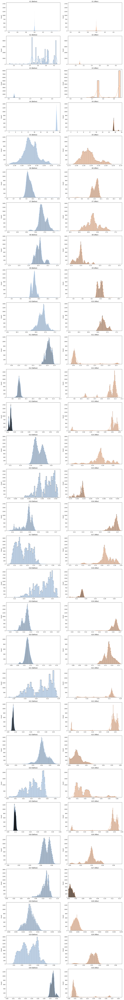

In [29]:
compare_histogram(train_before, train_after, columns=X_columns)

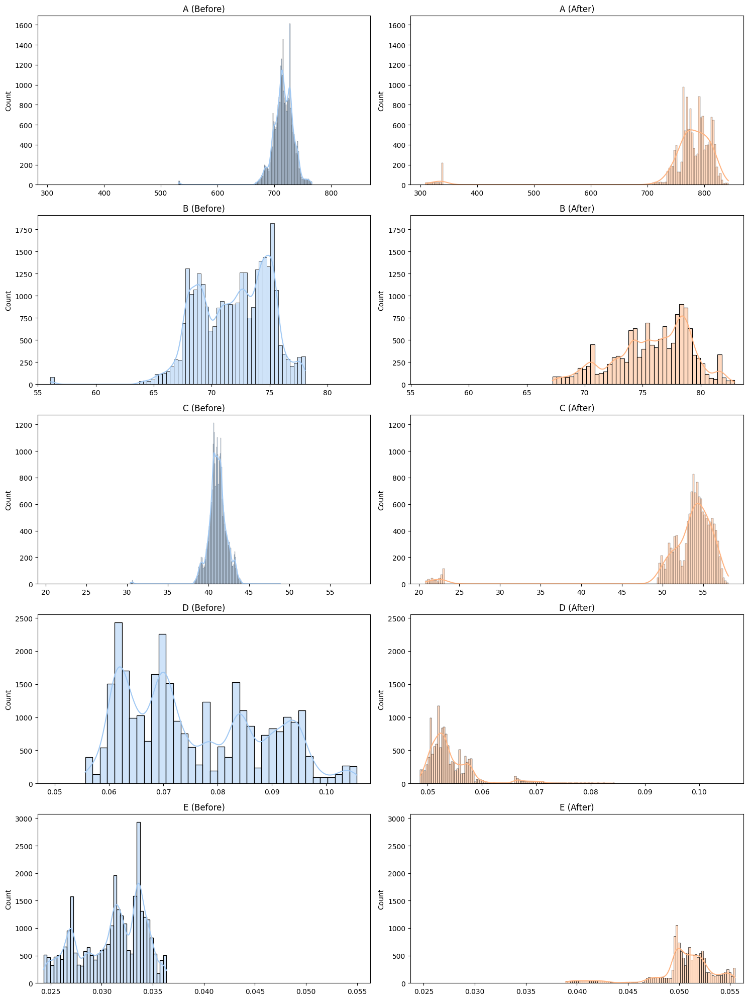

In [30]:
compare_histogram(train_before, train_after, columns=y_columns)

In [31]:
def compare_lineplot(train_before, train_after, columns=None):
    """
    train_before와 train_after 데이터셋의 모든 컬럼을 나란히 비교하는 시각화 함수
    
    Parameters:
    -----------
    train_before : pandas.DataFrame
        비교할 첫 번째 데이터셋
    train_after : pandas.DataFrame
        비교할 두 번째 데이터셋
    columns : list, optional
        시각화할 컬럼 리스트. None인 경우 모든 컬럼을 시각화
    """
    if columns is None:
        columns = train_before.columns
    
    num_cols = len(columns)
    fig, axes = plt.subplots(num_cols, 2, figsize=(15, 4 * num_cols))
    
    # 데이터가 한 개의 열인 경우, axes의 차원을 2D로 맞춰줌
    if num_cols == 1:
        axes = np.array([axes])
    
    for i, col in enumerate(columns):
        # train_before 데이터에 대한 히스토그램 (좌측)
        sns.lineplot(x = train_before.index, y = train_before[col], ax=axes[i, 0], color=sns.color_palette("pastel")[0])
        axes[i, 0].set_title(f"{col} (Before)")
        axes[i, 0].set_xlabel("")
        
        # train_after 데이터에 대한 히스토그램 (우측)
        sns.lineplot(x = train_after.index, y = train_after[col], ax=axes[i, 1], color=sns.color_palette("pastel")[1])
        axes[i, 1].set_title(f"{col} (After)")
        axes[i, 1].set_xlabel("")
        
        # y축 범위를 동일하게 설정
        y_min = min(axes[i, 0].get_ylim()[0], axes[i, 1].get_ylim()[0])
        y_max = max(axes[i, 0].get_ylim()[1], axes[i, 1].get_ylim()[1])
        axes[i, 0].set_ylim(y_min, y_max)
        axes[i, 1].set_ylim(y_min, y_max)

    
    plt.tight_layout()
    plt.show()

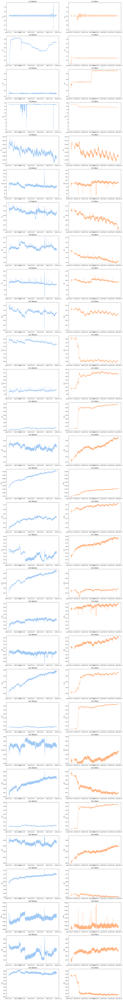

In [32]:
'''
Global Anomaly = 전역적인 범위에서 정상 범주로부터 큰 편차가 있는, 팍 튀는 데이터.
Trend Anomaly = 장기적인 패턴이나 방향에 이상이 있는 데이터. 평균이 크게 변하는 데이터. 
Contextual Anomaly = 특정 상황이나 문맥에서 정상 범주로부터 편차가 있는 데이터.
'''

compare_lineplot(train_before, train_after, columns=X_columns)

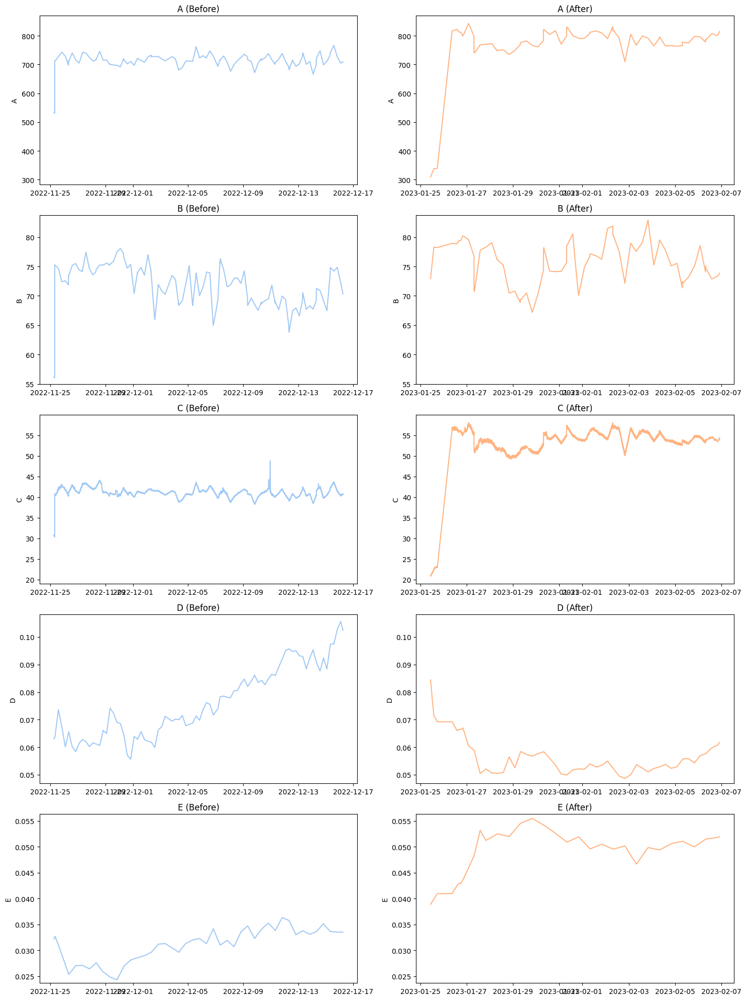

In [33]:
compare_lineplot(train_before, train_after, columns=y_columns)

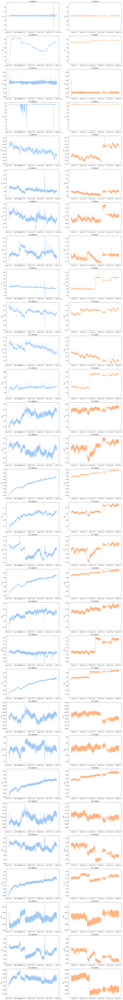

In [100]:
compare_lineplot(train_before, test_before, columns=X_columns)

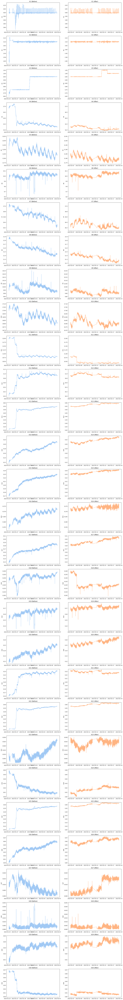

In [101]:
compare_lineplot(train_after, test_after, columns=X_columns)

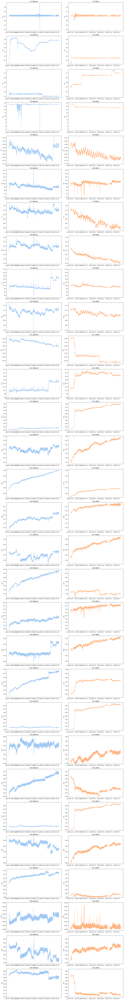

In [34]:
compare_lineplot(before, after, columns=X_columns)

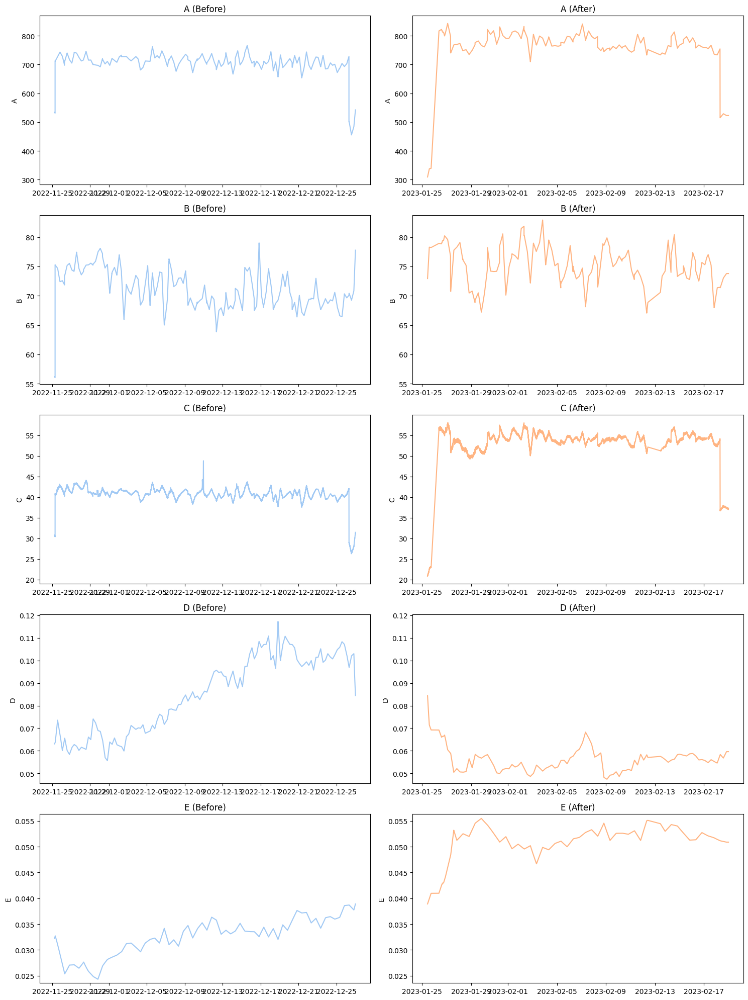

In [35]:
compare_lineplot(before, after, columns=y_columns)

In [36]:
train_before

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2022-11-25 06:15:00,3.999053,2.904105,0.512421,17.256421,11.969895,9.808474,17.270632,11.782316,9.716105,17.261368,...,0.085053,0.080737,0.020842,0.044421,0.066474,533.740825,56.166584,30.795462,0.063058,0.032226
2022-11-25 06:16:00,3.997158,2.904789,0.496368,17.296263,11.962579,9.812632,17.274737,11.792474,9.713211,17.250684,...,0.088000,0.080316,0.019947,0.048158,0.066316,533.704004,56.165217,30.695193,0.063065,0.032231
2022-11-25 06:17:00,3.996947,2.906474,0.489158,17.300737,11.971579,9.801684,17.277105,11.788526,9.715632,17.249368,...,0.085421,0.081684,0.019263,0.046579,0.067526,533.667183,56.163850,30.687938,0.063071,0.032236
2022-11-25 06:18:00,3.995895,2.904105,0.483526,17.274789,11.960579,9.818579,17.250158,11.795211,9.721105,17.243421,...,0.083263,0.082316,0.018000,0.043684,0.067316,533.630362,56.162483,30.703927,0.063078,0.032241
2022-11-25 06:19:00,3.994316,2.901000,0.504579,17.267421,11.971684,9.815421,17.277000,11.790158,9.730263,17.219105,...,0.085474,0.081368,0.018316,0.046368,0.066263,533.593541,56.161116,30.756081,0.063085,0.032246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-16 05:52:00,3.999684,3.844895,0.552053,17.064158,11.827474,9.913263,16.934684,11.941579,9.839000,16.895368,...,0.073421,0.121947,0.018263,0.035211,0.075211,709.211288,70.367305,40.682889,0.102475,0.033533
2022-12-16 05:53:00,3.999053,3.842947,0.550632,17.132158,11.817421,9.914158,16.931105,11.892842,9.837684,16.901421,...,0.070421,0.119737,0.017105,0.033579,0.074789,709.231410,70.359337,40.757415,0.102462,0.033533
2022-12-16 05:54:00,3.998737,3.846105,0.550947,17.125263,11.824632,9.932368,16.909211,11.911632,9.827632,16.894053,...,0.074737,0.120158,0.018474,0.035947,0.075053,709.251532,70.351372,40.644057,0.102448,0.033533


In [70]:
# # 정규화
# scaler = StandardScaler()
# train_before_scaled = pd.DataFrame(scaler.fit_transform(train_before), columns=train_before.columns, index=train_before.index)
# test_before_scaled = pd.DataFrame(scaler.transform(test_before), columns=test_before.columns, index=test_before.index)
# train_before_scaled#.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2022-11-25 06:15:00,-0.045720,-3.729511,-8.914816,0.940774,1.312732,-3.220550,3.695955,-3.036092,-3.577823,3.978515,...,2.293859,-2.780204,1.935563,1.657448,-2.351562,-9.751965,-5.109009,-9.006081,-1.029982,0.391606
2022-11-25 06:16:00,-0.212764,-3.726423,-12.724384,1.074336,1.156297,-3.119609,3.744590,-2.905282,-3.636835,3.850740,...,2.756895,-2.825191,1.650434,2.051587,-2.402749,-9.753937,-5.109452,-9.093486,-1.029430,0.393189
2022-11-25 06:17:00,-0.231325,-3.718821,-14.435567,1.089333,1.348746,-3.385377,3.772649,-2.956115,-3.587479,3.835004,...,2.351738,-2.678983,1.432395,1.885049,-2.010314,-9.755910,-5.109896,-9.099811,-1.028879,0.394772
2022-11-25 06:18:00,-0.324127,-3.729511,-15.772038,1.002350,1.113531,-2.975226,3.453402,-2.870038,-3.475892,3.763878,...,2.012729,-2.611503,1.029862,1.579730,-2.078564,-9.757882,-5.110339,-9.085873,-1.028327,0.396353
2022-11-25 06:19:00,-0.463331,-3.743528,-10.775884,0.977649,1.350997,-3.051890,3.771402,-2.935104,-3.289197,3.473079,...,2.360007,-2.712723,1.130495,1.862844,-2.419812,-9.759855,-5.110783,-9.040410,-1.027774,0.397934
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-16 05:52:00,0.009962,0.517142,0.490446,0.296252,-1.732680,-0.676590,-0.284035,-0.985151,-1.072470,-0.398577,...,0.466519,1.622901,1.113723,0.685977,0.480798,-0.351925,-0.499685,-0.387123,2.132214,0.810957
2022-12-16 05:53:00,-0.045720,0.508352,0.153205,0.524208,-1.947637,-0.654869,-0.326435,-1.612769,-1.099294,-0.326192,...,-0.004786,1.386719,0.744734,0.513888,0.344298,-0.350847,-0.502271,-0.322158,2.131125,0.810955
2022-12-16 05:54:00,-0.073561,0.522606,0.228148,0.501095,-1.793453,-0.212775,-0.585823,-1.370804,-1.304228,-0.414313,...,0.673232,1.431706,1.180812,0.763694,0.429611,-0.349769,-0.504857,-0.420973,2.130037,0.810952


In [72]:
# # 정규화
# train_after_scaled = pd.DataFrame(scaler.fit_transform(train_after), columns=train_after.columns, index=train_after.index)
# test_after_scaled = pd.DataFrame(scaler.transform(test_after), columns=test_after.columns, index=test_after.index)
# train_after_scaled#.head()

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,...,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,
2023-01-25 10:36:00,0.002945,-5.041668,-2.182327,3.030666,0.298162,-1.076198,1.939358,3.119459,-0.197492,1.449833,...,-3.291575,0.962543,0.363485,-4.608112,3.293758,-5.651414,-0.882039,-5.570437,5.892752,-3.690935
2023-01-25 10:37:00,-0.032868,-5.348367,-2.174952,3.034805,1.376617,-1.081581,2.017037,2.900830,-0.254750,1.582920,...,-3.734651,0.393078,-1.158758,-4.439479,3.498164,-5.649699,-0.873979,-5.570617,5.879146,-3.689376
2023-01-25 10:38:00,-0.080618,-5.510396,-2.164417,3.028533,1.363032,-1.368002,1.902175,2.768293,-0.429890,1.392240,...,-3.635083,0.493572,-0.442408,-4.449399,3.515487,-5.647983,-0.865920,-5.547308,5.865552,-3.687817
2023-01-25 10:39:00,0.044726,-5.394661,-2.166524,3.037314,1.409013,-1.640425,1.956293,2.931982,-0.342320,1.561906,...,-3.654997,0.594066,-0.317047,-4.717227,3.536274,-5.646268,-0.857862,-5.545830,5.851971,-3.686258
2023-01-25 10:40:00,0.026820,-5.415879,-2.189174,3.054500,1.356762,-1.173107,1.876773,2.890635,-0.546651,1.711336,...,-3.724694,0.381912,-0.997580,-4.300605,3.460054,-5.644553,-0.849806,-5.551323,5.838401,-3.684699
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-02-06 21:22:00,-0.026899,0.316873,0.853872,-0.844571,-0.835679,0.548648,-2.834375,-1.360736,-0.857638,-1.604148,...,1.751516,-0.935673,-0.299139,0.242556,-0.472167,0.481868,-0.657132,0.148840,1.355909,0.455792
2023-02-06 21:37:00,0.050695,0.031392,0.815946,-0.894747,-0.945406,-0.103875,-2.585510,-1.449660,-1.210165,-1.623606,...,1.681819,-1.103162,0.112763,-0.124468,-0.427129,0.503058,-0.639433,0.179783,1.379505,0.462243
2023-02-06 21:58:00,-0.026899,0.145199,0.827535,-0.841309,-0.891065,0.156704,-3.186322,-1.435500,-1.308962,-1.645397,...,1.776408,-0.868677,-0.120051,0.113602,-0.416735,0.532725,-0.614733,0.212807,1.412372,0.471266


## 2.2. 상관관계 분석

In [70]:
def correlation_test(df: pd.DataFrame, X_cols: list, y_col: str) -> pd.DataFrame:
    """
    연속형 변수와 타겟 변수 간의 상관관계를 분석하는 함수
    
    Parameters:
    -----------
    df : pandas.DataFrame
        입력 데이터프레임
    X_cols : list
        연속형 변수 컬럼 리스트
    y_col : str
        타겟 변수명
    
    Returns:
    --------
    pandas.DataFrame
        각 변수별 상관분석 결과 (변수명, 상관계수, 절대상관계수, 검정방법, p-value)
    """
    results = []
    for col in X_cols:
        # 정규성 검정 (Shapiro-Wilk test)
        _, p_value = stats.shapiro(df[col].dropna())
        is_normal = p_value > 0.05
        
        if is_normal:
            # Pearson 상관분석
            corr, p_value = stats.pearsonr(df[col].dropna(), df[y_col].dropna())
            test = 'pearson'
        else:
            # 정규성 만족하지 않으면 Spearman 사용
            corr, p_value = stats.spearmanr(df[col].dropna(), df[y_col].dropna())
            test = 'spearman'
            
        results.append({
            'var_name': col,
            'corr_value': round(corr, 3),
            'corr_abs_value': round(abs(corr), 3),
            'test': test,
            'p_value': round(p_value, 3)
        })
    
    # DataFrame 생성 및 정렬
    result_df = pd.DataFrame(results)
    result_df = result_df.sort_values('corr_abs_value', ascending=False)
    
    return result_df

In [108]:
before_corr = correlation_test(train_before, X_columns, 'E')
before_corr

,var_name,corr_value,corr_abs_value,test,p_value
23,X24,0.881,0.881,spearman,0.000
14,X15,0.871,0.871,spearman,0.000
26,X27,0.867,0.867,spearman,0.000
20,X21,0.859,0.859,spearman,0.000
17,X18,0.848,0.848,spearman,0.000
8,X9,-0.842,0.842,spearman,0.000
4,X5,-0.700,0.700,spearman,0.000
15,X16,0.696,0.696,spearman,0.000
1,X2,-0.677,0.677,spearman,0.000
18,X19,0.658,0.658,spearman,0.000


In [73]:
correlation_test(train_after, X_columns, 'E')

,var_name,corr_value,corr_abs_value,test,p_value
8,X9,-0.523,0.523,spearman,0.000
5,X6,-0.505,0.505,spearman,0.000
26,X27,0.432,0.432,spearman,0.000
27,X28,-0.348,0.348,spearman,0.000
2,X3,-0.339,0.339,spearman,0.000
9,X10,-0.323,0.323,spearman,0.000
28,X29,-0.320,0.320,spearman,0.000
23,X24,0.319,0.319,spearman,0.000
29,X30,0.317,0.317,spearman,0.000
11,X12,-0.311,0.311,spearman,0.000


In [81]:
def plot_multiple_lines(df, columns, title="Multiple Variables Plot", figsize=(20, 10)):
    """
    여러 변수를 하나의 plot에 그리는 함수
    
    Parameters:
    -----------
    df : pandas.DataFrame
        데이터프레임
    columns : list
        그릴 컬럼명 리스트
    title : str
        그래프 제목
    figsize : tuple
        그래프 크기 (width, height)
    """
    plt.figure(figsize=figsize)
    
    for col in columns:
        sns.lineplot(data=df, x=df.index, y=col, label=col)
    
    plt.title(title)
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()

## 2.3. Top 5 상관관계 변수 시각화 

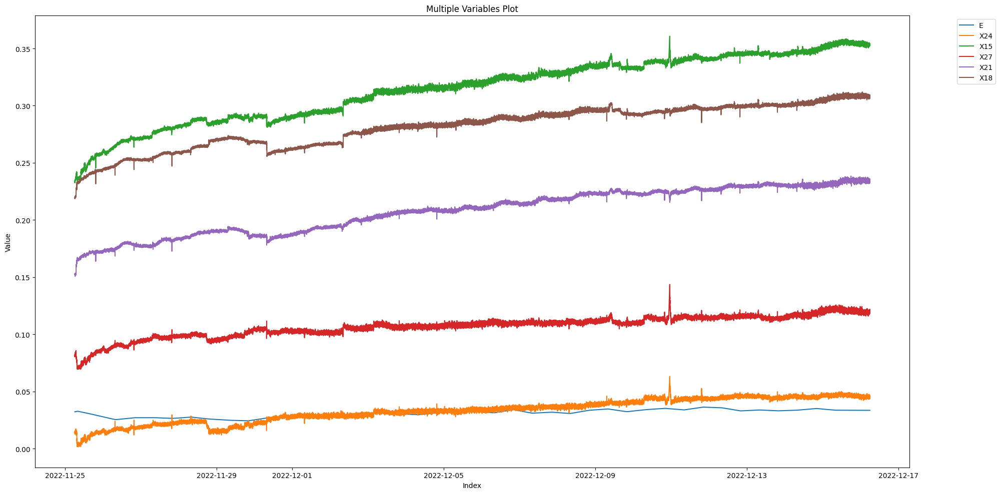

In [83]:
plot_multiple_lines(train_before, ['E', 'X24', 'X15', 'X27', 'X21', 'X18'])

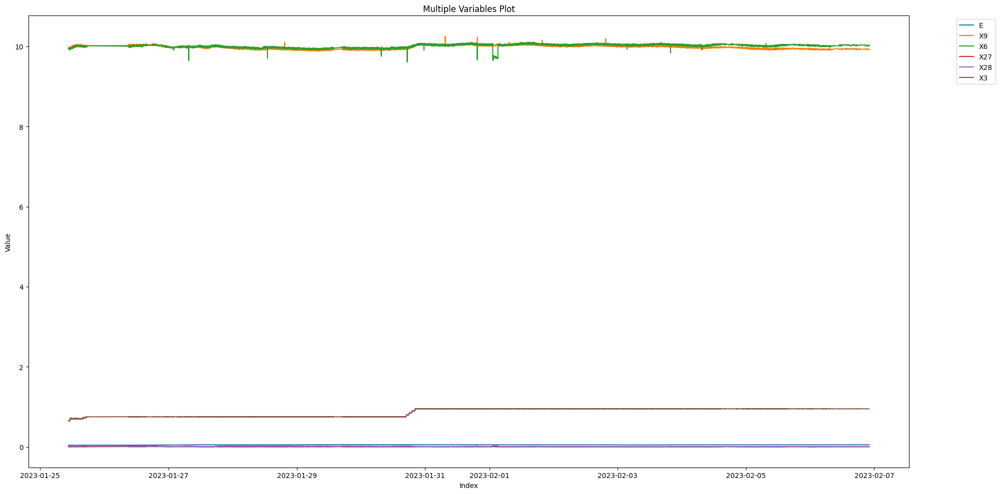

In [84]:
plot_multiple_lines(train_after, ['E', 'X9', 'X6', 'X27', 'X28', 'X3'])

In [87]:
from statsmodels.tsa.seasonal import STL
import matplotlib.pyplot as plt

def stl_decomposition(df, column, period=1440, figsize=(20, 12)):
    """
    시계열 데이터에 대해 STL Decomposition을 수행하는 함수
    
    Parameters:
    -----------
    df : pandas.DataFrame
        데이터프레임
    column : str
        분석할 컬럼명
    period : int
        계절성 주기 (기본값: 1440 = 하루의 분 수)
    figsize : tuple
        그래프 크기
    """
    # STL Decomposition 수행
    stl = STL(df[column], period=period)
    result = stl.fit()
    
    # 결과 시각화
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=figsize)
    
    # 원본 데이터
    ax1.plot(df.index, df[column])
    ax1.set_title('Original Data')
    ax1.set_xlabel('Time')
    ax1.set_ylabel('Value')
    
    # 추세
    ax2.plot(df.index, result.trend)
    ax2.set_title('Trend')
    ax2.set_xlabel('Time')
    ax2.set_ylabel('Value')
    
    # 계절성
    ax3.plot(df.index, result.seasonal)
    ax3.set_title('Seasonal')
    ax3.set_xlabel('Time')
    ax3.set_ylabel('Value')
    
    # 잔차
    ax4.plot(df.index, result.resid)
    ax4.set_title('Residual')
    ax4.set_xlabel('Time')
    ax4.set_ylabel('Value')
    
    plt.tight_layout()
    plt.show()
    
    return result

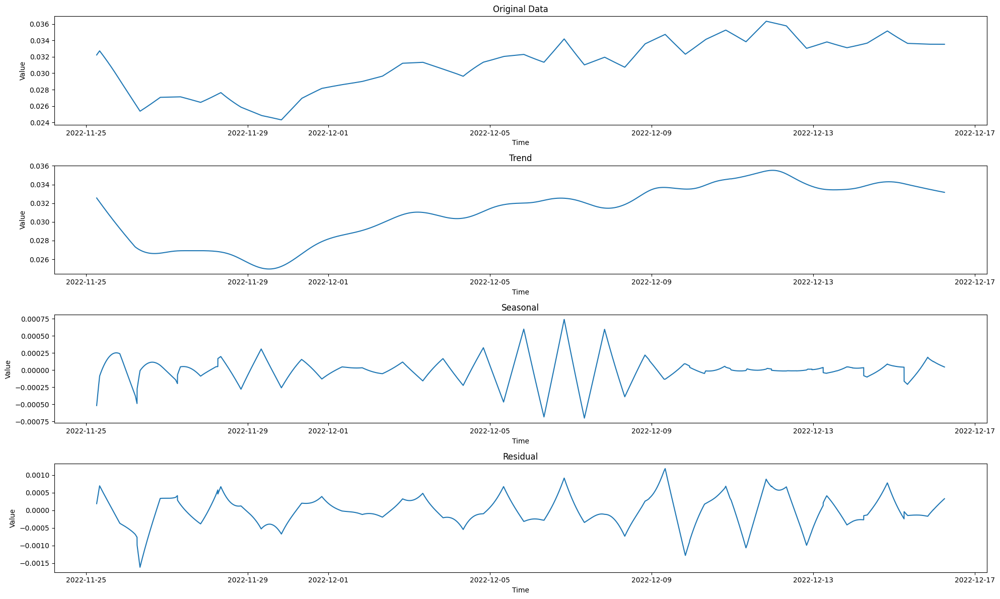


Trend 통계:
count    30178.000000
mean         0.031018
std          0.003008
min          0.024957
25%          0.028467
50%          0.031715
75%          0.033590
max          0.035516
Name: trend, dtype: float64

Seasonal 통계:
count    30178.000000
mean         0.000003
std          0.000173
min         -0.000702
25%         -0.000055
50%          0.000006
75%          0.000067
max          0.000740
Name: season, dtype: float64

Residual 통계:
count    30178.000000
mean        -0.000016
std          0.000407
min         -0.001617
25%         -0.000257
50%         -0.000046
75%          0.000276
max          0.001182
Name: resid, dtype: float64


In [88]:
# E 변수에 대한 STL Decomposition 수행
result = stl_decomposition(train_before, 'E')

# 결과값 확인
print("\nTrend 통계:")
print(result.trend.describe())
print("\nSeasonal 통계:")
print(result.seasonal.describe())
print("\nResidual 통계:")
print(result.resid.describe())

# 3. 전처리

## 3.1. 시간 간격 중간의 결측치 처리

### 3.1.1. 컬럼 별 정상성 여부 확인

In [120]:
def check_stationarity(data, signif=0.05):
    """
    모든 변수에 대해 ADF 테스트를 수행하는 함수
    
    Parameters:
    -----------
    data : pandas.DataFrame
        검정할 데이터프레임
    signif : float
        유의수준 (기본값: 0.05)
    
    Returns:
    --------
    pandas.DataFrame
        각 변수별 정상성 검정 결과를 담은 데이터프레임
    """
    results = []
    stationary_cols = []
    non_stationary_cols = []
    
    for col in data.columns:            
        # ADF 검정 실행: H_0 = 비정상성, H_1 = 정상성
        result = adfuller(data[col].dropna())
        
        # 결과 저장
        results.append({
            'variable': col,
            'stationary': result[1] < signif,  # p-value < 유의수준이면 정상성 만족
            'p_value': result[1],
            'test_statistic': result[0]  # ADF 검정통계량
        })
        if result[1] < signif:
            stationary_cols.append(col)
        else:
            non_stationary_cols.append(col)
    
    # 결과를 데이터프레임으로 변환
    result_df = pd.DataFrame(results)
    
    return result_df, stationary_cols, non_stationary_cols

In [121]:
stationarity_before, stationary_cols_before, non_stationary_cols_before = check_stationarity(train_before)
stationarity_before

,variable,stationary,p_value,test_statistic
0,X1,True,0.000000e+00,-26.502655
1,X2,True,1.733147e-03,-3.944113
2,X3,True,0.000000e+00,-19.758968
3,X4,True,1.115687e-19,-10.907949
4,X5,False,2.838289e-01,-2.006274
5,X6,True,1.998870e-10,-7.230644
6,X7,True,4.407419e-05,-4.847528
7,X8,True,1.323032e-02,-3.338810
8,X9,True,2.946197e-11,-7.564733
9,X10,True,4.250786e-04,-4.311029


In [123]:
stationarity_after, stationary_cols_after, non_stationary_cols_after = check_stationarity(train_after)
stationarity_after

,variable,stationary,p_value,test_statistic
0,X1,True,2.694266e-16,-9.543060
1,X2,True,3.696031e-17,-9.884439
2,X3,False,4.496427e-01,-1.664206
3,X4,False,5.385949e-02,-2.831901
4,X5,False,2.549772e-01,-2.074291
5,X6,True,4.888336e-07,-5.790368
6,X7,False,8.553283e-01,-0.666131
7,X8,False,7.770447e-02,-2.679215
8,X9,False,7.181278e-01,-1.092313
9,X10,False,5.078747e-01,-1.551548


In [107]:
'''
1. 정상 -> 비정상 시계열화 (트렌드 발생):
- X3, X4, X7, X8, X9, X10, X18, X20, X23, B

2. 비정상 -> 정상 시계열화 (트렌드 소멸):
- X4, X11, X13, X14, X17, X22, X24, X25, X29, X30, D, E

3. 항상 정상 시계열:
- X1, X2, X6, X12, X15, X16, X19, X21, X26, X28, A, C
   
4. 항상 비정상 시계열:
- X5, X27: 항상 비정상 시계열인 변수는 적은 수로 존재함

'''
cols = ['variable', 'stationary']
pd.merge(stationarity_train_before[cols], stationarity_train_after[cols], on='variable')

,variable,stationary_x,stationary_y
0,X1,True,True
1,X2,True,True
2,X3,True,False
3,X4,True,False
4,X5,False,False
5,X6,True,True
6,X7,True,False
7,X8,True,False
8,X9,True,False
9,X10,True,False


### 3.1.2. 생략된 행 처리

In [135]:
import pandas as pd

def add_missing_timestamps(df: pd.DataFrame, missing_intervals: list) -> pd.DataFrame:
    """
    주어진 DataFrame에 nested list 형태의 missing_intervals에 포함된 Timestamp들을
    인덱스로 추가하여, NaN이 채워질 수 있도록 reindex한 새로운 DataFrame을 반환합니다.
    
    Parameters
    ----------
    df : pd.DataFrame
        DatetimeIndex를 가진 원본 데이터프레임.
    missing_intervals : List[List[pd.Timestamp]]
        연속 결측 구간별 Timestamp 리스트를 포함하는 nested list.
    
    Returns
    -------
    pd.DataFrame
        missing_timestamps가 추가된 DatetimeIndex를 가진 reindexed DataFrame.
    """
    # 1) nested list 평탄화 및 중복 제거
    missing_ts = sorted({ts for interval in missing_intervals for ts in interval})
    
    # 2) 기존 인덱스와 합쳐 새 인덱스 생성
    new_index = df.index.union(pd.DatetimeIndex(missing_ts))
    
    # 3) 재색인 후 정렬
    df_reindexed = df.reindex(new_index).sort_index()
    
    return df_reindexed

# 사용 예시
# df = pd.read_csv('/mnt/data/train.csv', parse_dates=['Getting_Time']).set_index('Getting_Time')
# train_before_missing = [
#     list(pd.date_range('2022-12-10 22:32:00', '2022-12-10 22:54:00', freq='T')),
#     list(pd.date_range('2022-12-13 13:55:00', '2022-12-13 13:59:00', freq='T'))
# ]
train_before_filled = add_missing_timestamps(train_before, train_before_missing)


In [141]:
train_before[train_before.index == '2022-12-10 22:33:00']

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,A,B,C,D,E
Getting_Time,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


In [140]:
train_before_filled[train_before_filled.index == '2022-12-10 22:33:00']

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,A,B,C,D,E
2022-12-10 22:33:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 3.1.3. 정상성 여부에 따른 결측치 행 처리

- 정상 시계열 변수: 단순 exponential smoothing 적용
- 비정상 시계열 변수: Holt's Linear Exponential Smoothing 적용

In [148]:
def impute_by_stationarity_v2(df: pd.DataFrame,
                              stationary_cols: list,
                              non_stationary_cols: list) -> pd.DataFrame:
    """
    개선된 결측치 대체 함수:
    - 모델 예측 범위를 first/last valid index로 제한하여
      edge extrapolation으로 인한 NaN 문제 해결
    - 남은 leading/trailing NaN은 forward/backward fill로 보완
    """
    df_imp = df.copy()
    
    # 정상 시계열: Simple Exponential Smoothing
    for col in stationary_cols:
        s = df_imp[col]
        first, last = s.first_valid_index(), s.last_valid_index()
        fit = SimpleExpSmoothing(s.loc[first:last].dropna(),
                                 initialization_method='estimated').fit()
        preds = fit.predict(start=first, end=last)
        # 중간 구간 보간
        s.loc[first:last] = s.loc[first:last].fillna(preds)
        # 남은 NaN: 앞뒤 보간
        s.fillna(method='ffill', inplace=True)
        s.fillna(method='bfill', inplace=True)
        df_imp[col] = s

    # 비정상 시계열: Holt’s Linear Exponential Smoothing
    for col in non_stationary_cols:
        s = df_imp[col]
        first, last = s.first_valid_index(), s.last_valid_index()
        fit = ExponentialSmoothing(s.loc[first:last].dropna(),
                                   trend='add', seasonal=None,
                                   initialization_method='estimated').fit()
        preds = fit.predict(start=first, end=last)
        s.loc[first:last] = s.loc[first:last].fillna(preds)
        s.fillna(method='ffill', inplace=True)
        s.fillna(method='bfill', inplace=True)
        df_imp[col] = s

    return df_imp

In [149]:
train_before_imputed = impute_by_stationarity_v2(train_before_filled, stationary_cols_before, non_stationary_cols_before)

In [150]:
check_columns(train_before_imputed)

<데이터 전체 관찰값 개수 = 30222> 

X1: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 1172, 결측치 비율 = 0.0
X2: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 6274, 결측치 비율 = 0.0
X3: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 762, 결측치 비율 = 0.0
X4: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 6822, 결측치 비율 = 0.0
X5: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 3687, 결측치 비율 = 0.0
X6: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 3589, 결측치 비율 = 0.0
X7: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 6172, 결측치 비율 = 0.0
X8: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 5168, 결측치 비율 = 0.0
X9: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 3565, 결측치 비율 = 0.0
X10: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 6099, 결측치 비율 = 0.0
X11: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 5058, 결측치 비율 = 0.0
X12: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 3526, 결측치 비율 = 0.0
X13: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 1115, 결측치 비율 = 0.0
X14: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 1107, 결측치 비율 = 0.0
X15: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 2824, 결측치 비율 = 0.0
X16: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 881, 결측치 비율 = 0.0
X17: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 1341, 결측치 비율 = 0.0
X18: 관찰값 개수 = 30222, 유니크한 관찰값 개수 = 2108, 결측치 비율 = 0.0
X19: 관찰값 개수 =

In [151]:
train_before_imputed[train_before_imputed.isnull().any(axis=1)]

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,A,B,C,D,E


In [152]:
train_before_imputed[train_before_imputed.index == '2022-12-10 22:32:00']

,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,X24,X25,X26,X27,X28,X29,X30,A,B,C,D,E
2022-12-10 22:32:00,3.998632,3.456579,0.551158,17.043211,11.895053,9.959895,16.918737,11.963421,9.840947,16.991474,11.832421,10.029263,0.224053,0.175684,0.338105,0.141105,0.125895,0.294526,0.125368,0.105158,0.224211,0.082947,0.049789,0.043579,0.098684,0.070526,0.113895,0.015737,0.020737,0.070316,728.72734,70.43286,41.853935,0.085515,0.034968
